In [1]:
#import the data
#create dataframe of descriptive stats of the residuals as well as of the raw lab values
#correlation matrix 


In [2]:
#libraries and dirrectory 
import pandas as pd
import numpy as np
import os
# from sklearn.linear_model import LinearRegression
# from sklearn.metrics import mean_squared_error, r2_score
# from scipy.optimize import curve_fit

import seaborn as sns
import matplotlib.pyplot as plt

# importing the data

In [31]:
# df = pd.read_excel("C:/Users/maega/UFL Dropbox/Maegan Cremer/research-share/Maegan/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/012 Processed Data/DFsForSVM_top60E_woEcho_2024-08-06_v1/AL-KnownPts_top60E_woEcho_1Sheet_2024-08-06_v1.xlsx")
#need a way to remove the old penalty scores to properly visualize this data set

In [49]:
df = pd.read_excel("C:/Users/maega/UFL Dropbox/Maegan Cremer/research-share/Maegan/Projects/Cardiac-Amyloidosis-Multiple-Myeloma/014_Mistic2/DFsForSVM_top60EwoEcho_20241014_v1/AL-KnownPts_top60EwoEcho_1Sheet_20241014_v1.xlsx")

In [50]:
color_map = "PiYG"

# large correlation map

Text(0.5, 1.0, 'correlation all features')

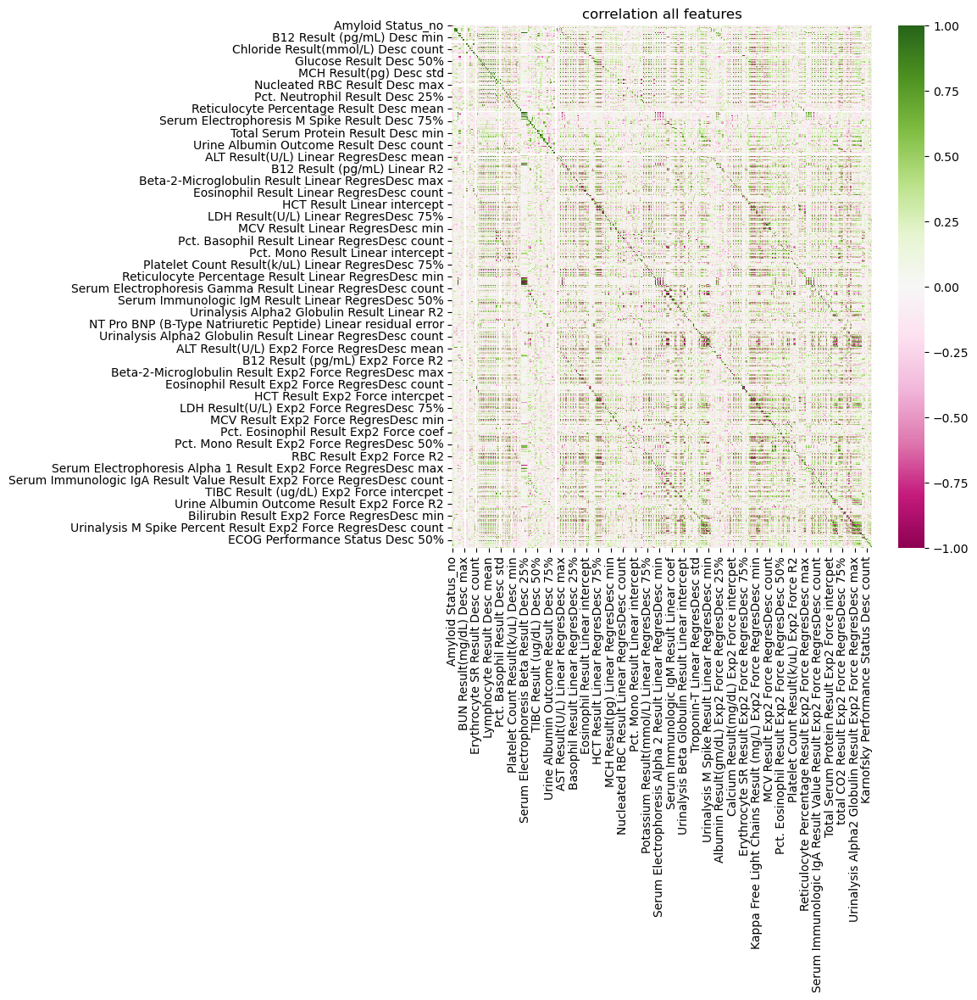

In [51]:
matrix_all = df.iloc[:,1:].corr()
#visualizing matrix 
# import seaborn as sns
# import matplotlib as plt
fig, ax = plt.subplots(figsize=(8,8))
ax = sns.heatmap(matrix_all, cmap = color_map, annot = False)
plt.title("correlation all features")

In [52]:
#missingness plot
df_missingness = df.iloc[:,1:]


In [53]:
features = df_missingness.columns
#segment feature list
numb_segments = 10



<Axes: >

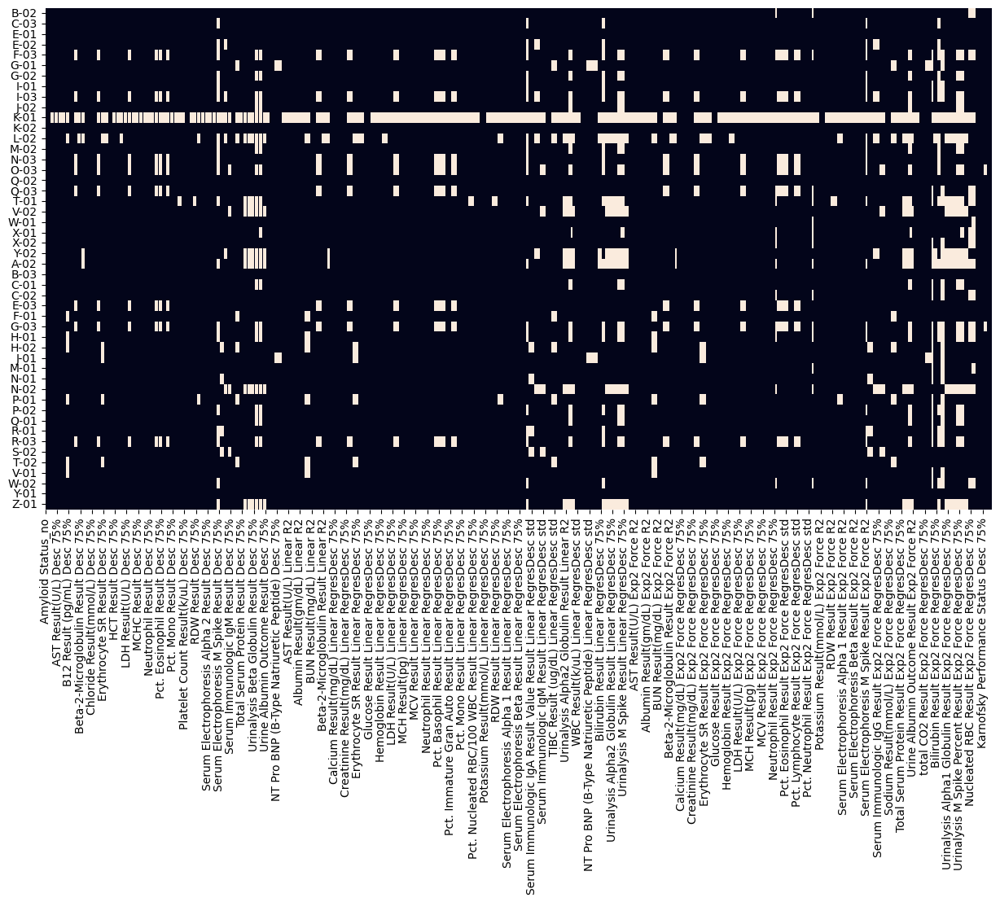

In [54]:
fig, ax =plt.subplots(figsize = (15, 8))
sns.heatmap(df_missingness.isna(), cbar=False, yticklabels=df.iloc[:,0])

# Comparing the lab descriptive statistics with the descriptive stats of the residuals from the fits

## linear and linear forced

In [55]:
#collect all columns with "Desc"
columns = df.columns
columns_Desc = []
columns_RegresDesc = []

for column in columns: 
    if "Desc" in column:
        if "Linear" not in column:
            if "Quadratic" not in column:
                if "Exp2" not in column: 
                    columns_Desc.append(column)
    if "RegresDesc" in column:
        if "Quadratic" not in column:
            if "Exp2" not in column:
                if "NotForced" not in column:
                    columns_RegresDesc.append(column)

    

In [56]:
df_desc = df[columns_Desc]
df_regresdesc = df[columns_RegresDesc]

In [57]:
#concat dataframes
df_comp_DescStats_linear = pd.concat([df_desc, df_regresdesc], axis = 1)
matrix_DescStats_linear = df_comp_DescStats_linear.corr()

Text(0.5, 1.0, 'Lab Value Desc Stats vs Linear Residuals Desc Stats')

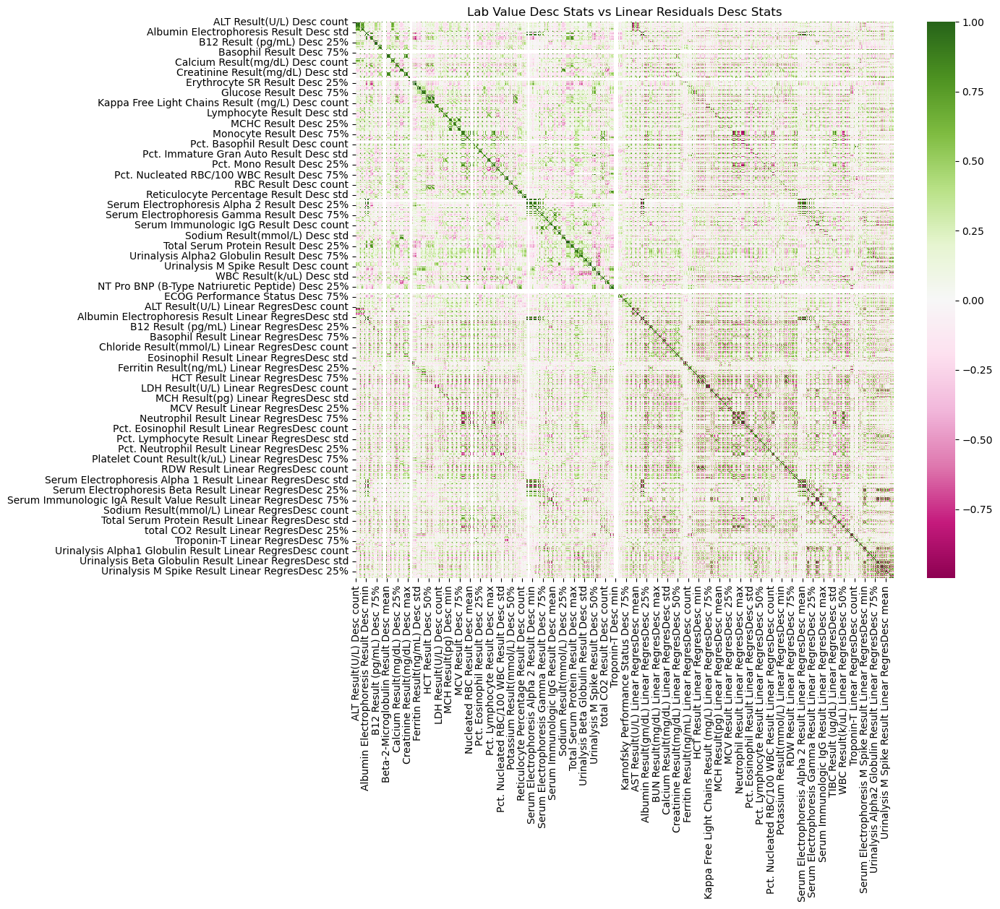

In [58]:
#visualizing matrix 
# import seaborn as sns
# import matplotlib as plt
fig, ax = plt.subplots(figsize=(12,10))
ax = sns.heatmap(matrix_DescStats_linear, cmap = color_map, annot = False)
plt.title("Lab Value Desc Stats vs Linear Residuals Desc Stats")

### comparing desc with linear coeficients 

Text(0.5, 1.0, 'Lab Value Desc Stats vs Linear Fit Parameters')

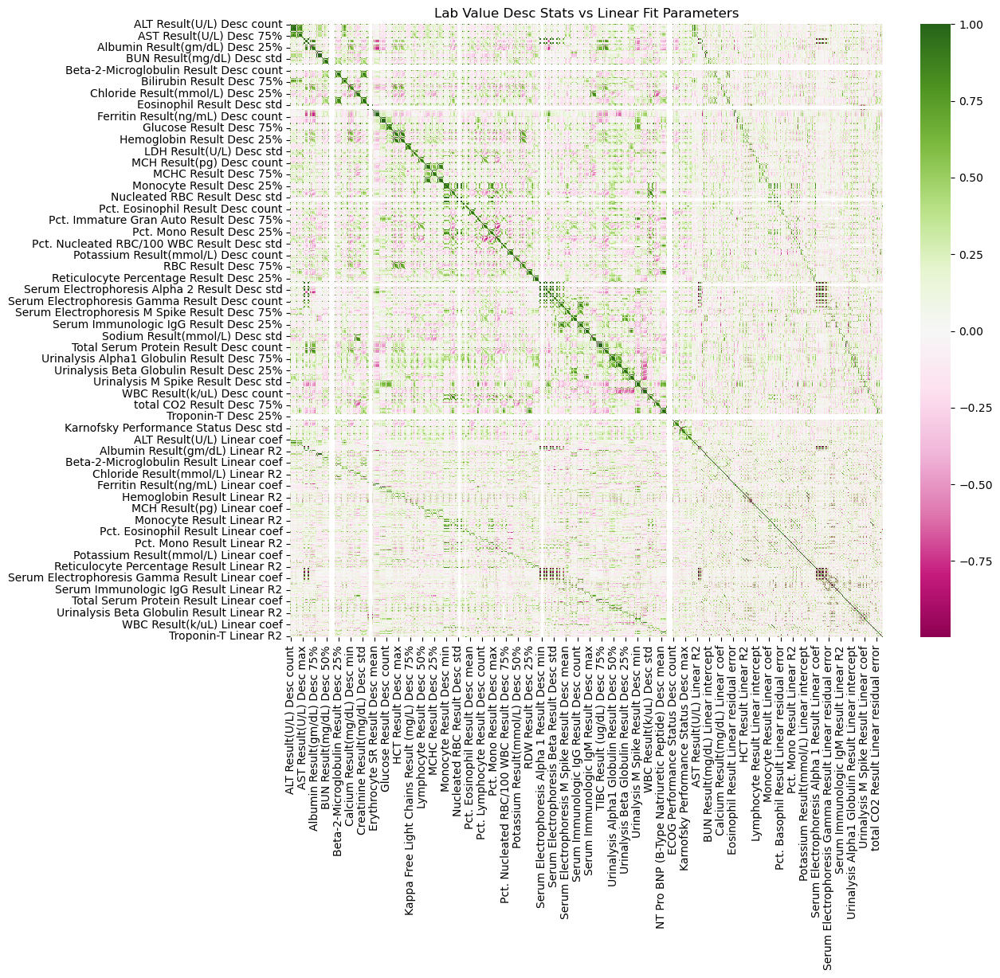

In [59]:
columns_linear_params = []

for column in columns:
    if "Linear" in column:
        if "Quadratic" not in column:
            if "Exp2" not in column:
                if "RegresDesc" not in column:
                    if "NotForced" not in column:
                        columns_linear_params.append(column)

df_linear_params = df[columns_linear_params]

df_desc_vs_linear_params = pd.concat([df_desc, df_linear_params], axis = 1)
matix_desc_vs_linear_params = df_desc_vs_linear_params.corr()

fig, ax = plt.subplots(figsize=(12,10))
ax =sns.heatmap(matix_desc_vs_linear_params, cmap = color_map, annot = False )
plt.title("Lab Value Desc Stats vs Linear Fit Parameters")

## comparing with the exponential character

Text(0.5, 1.0, 'Lab Value Desc Stats vs Exp Fit Params')

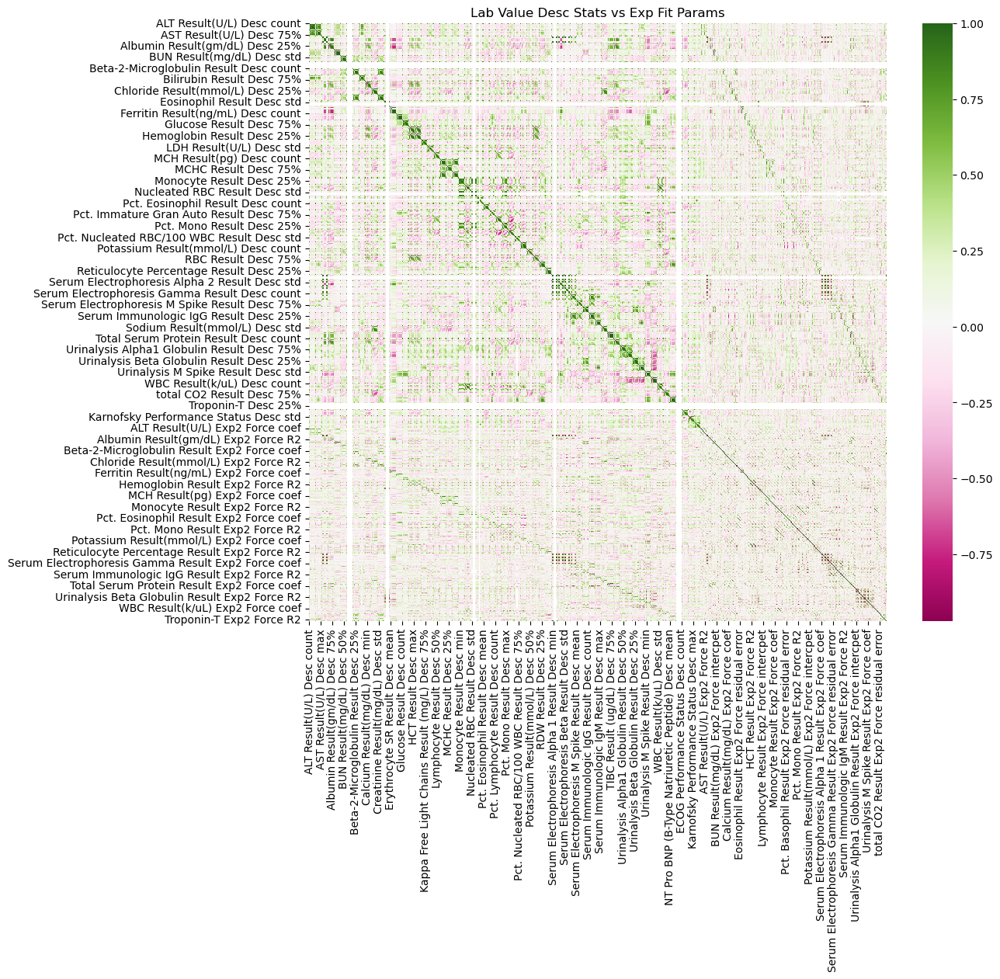

In [60]:
columns_exp_params = []

for column in columns:
    if "Exp2" in column:
        if "Quadratic" not in column:
            if "Linear" not in column:
                if "RegresDesc" not in column:
                    if "NotForced" not in column:
                        columns_exp_params.append(column)

df_exp_params = df[columns_exp_params]

df_desc_vs_exp_params = pd.concat([df_desc, df_exp_params], axis = 1)
matix_desc_vs_exp_params = df_desc_vs_exp_params.corr()

fig, ax = plt.subplots(figsize=(12,10))
ax =sns.heatmap(matix_desc_vs_exp_params, cmap = color_map, annot = False, )
plt.title("Lab Value Desc Stats vs Exp Fit Params")

### comparing exponential residuals to descriptives of raw data

Text(0.5, 1.0, 'Lab Value Desc Stats vs Exp Residuals Desc Stats')

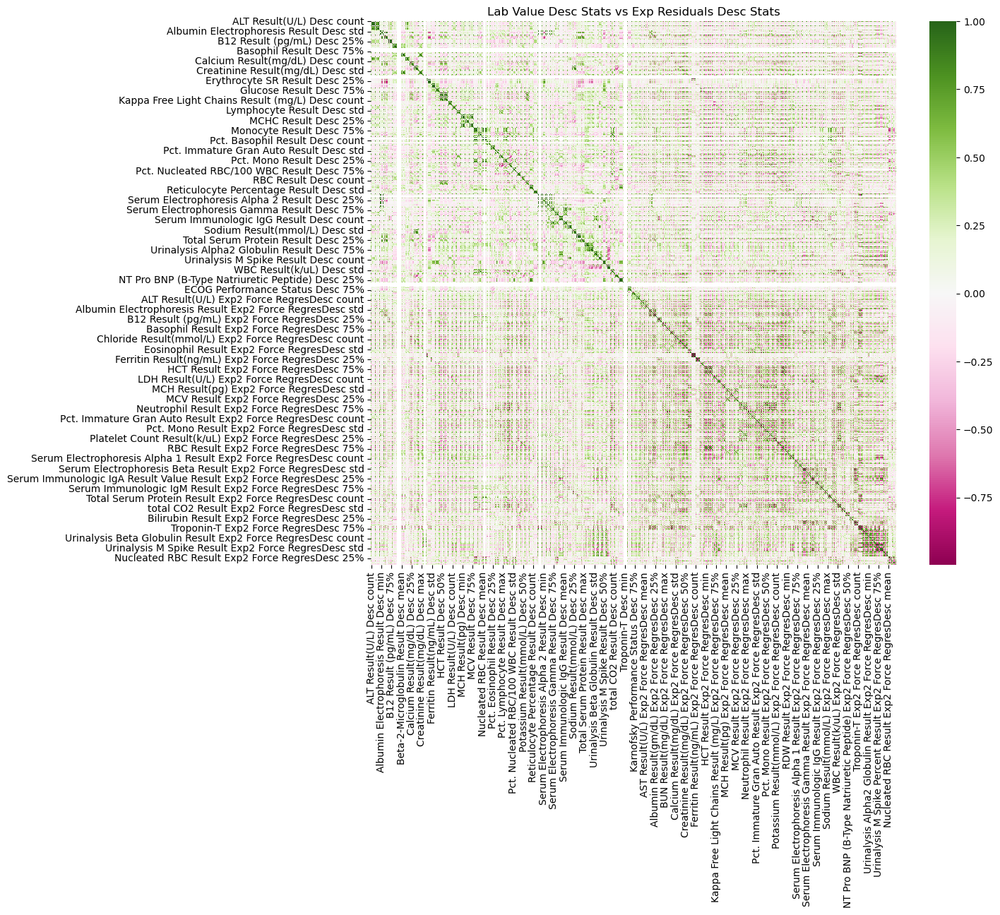

In [61]:
columns_exp_residuals = []

for column in columns:
    if "Exp2" in column:
        if "Quadratic" not in column:
            if "Linear" not in column:
                if "RegresDesc" in column:
                    if "NotForced" not in column:
                        columns_exp_residuals.append(column)

df_exp_residuals = df[columns_exp_residuals]

df_desc_vs_exp_residuals = pd.concat([df_desc, df_exp_residuals], axis = 1)
matix_desc_vs_exp_residuals = df_desc_vs_exp_residuals.corr()

fig, ax = plt.subplots(figsize=(12,10))
ax =sns.heatmap(matix_desc_vs_exp_residuals, cmap = color_map, annot = False )
plt.title("Lab Value Desc Stats vs Exp Residuals Desc Stats")

### comparing exponential residuals to linear residuals

Text(0.5, 1.0, 'Residual Desc Stats Linear vs Exp Fits')

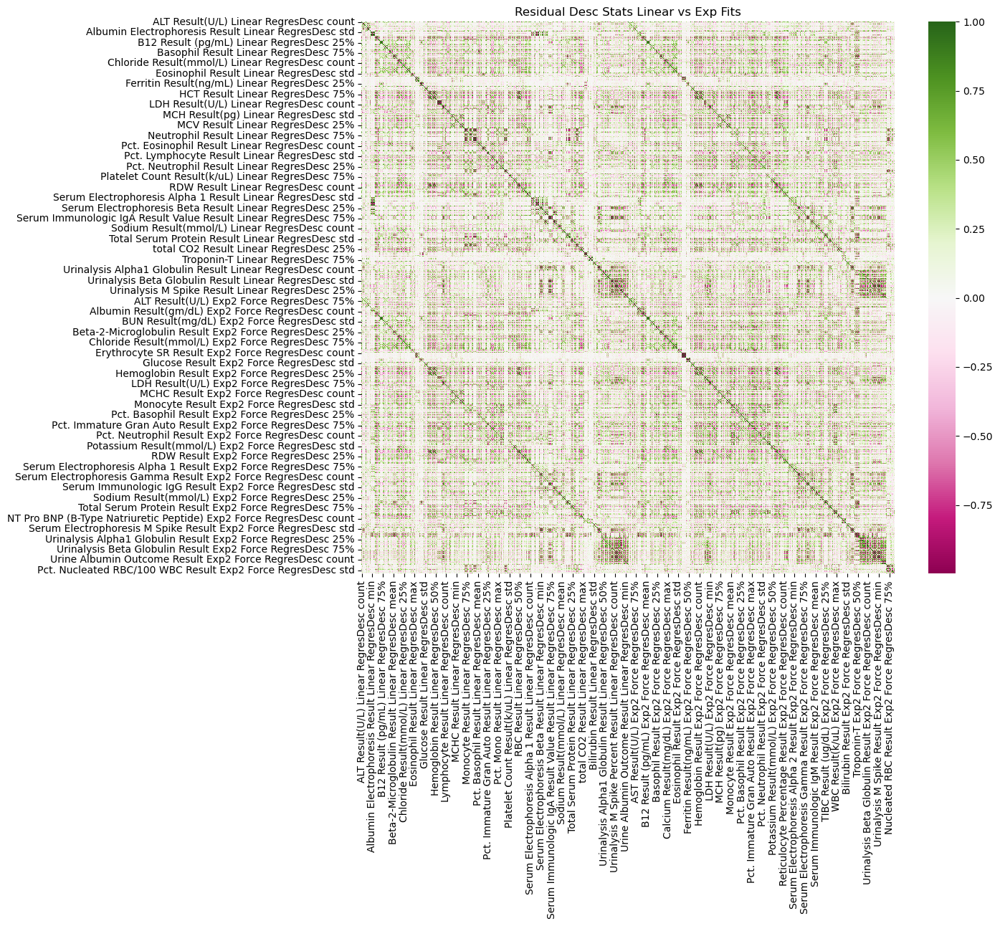

In [62]:
df_regresdesc_linear_exp = pd.concat([df_regresdesc,df_exp_residuals], axis = 1)

matrix_regresdesc_linear_exp = df_regresdesc_linear_exp.corr()

fig, ax = plt.subplots(figsize=(12,10))
ax =sns.heatmap(matrix_regresdesc_linear_exp, cmap = color_map, annot = False)
plt.title("Residual Desc Stats Linear vs Exp Fits")

# comparing both linear functions

Text(0.5, 1.0, 'Comparing parameters of linear fits with forced intercept')

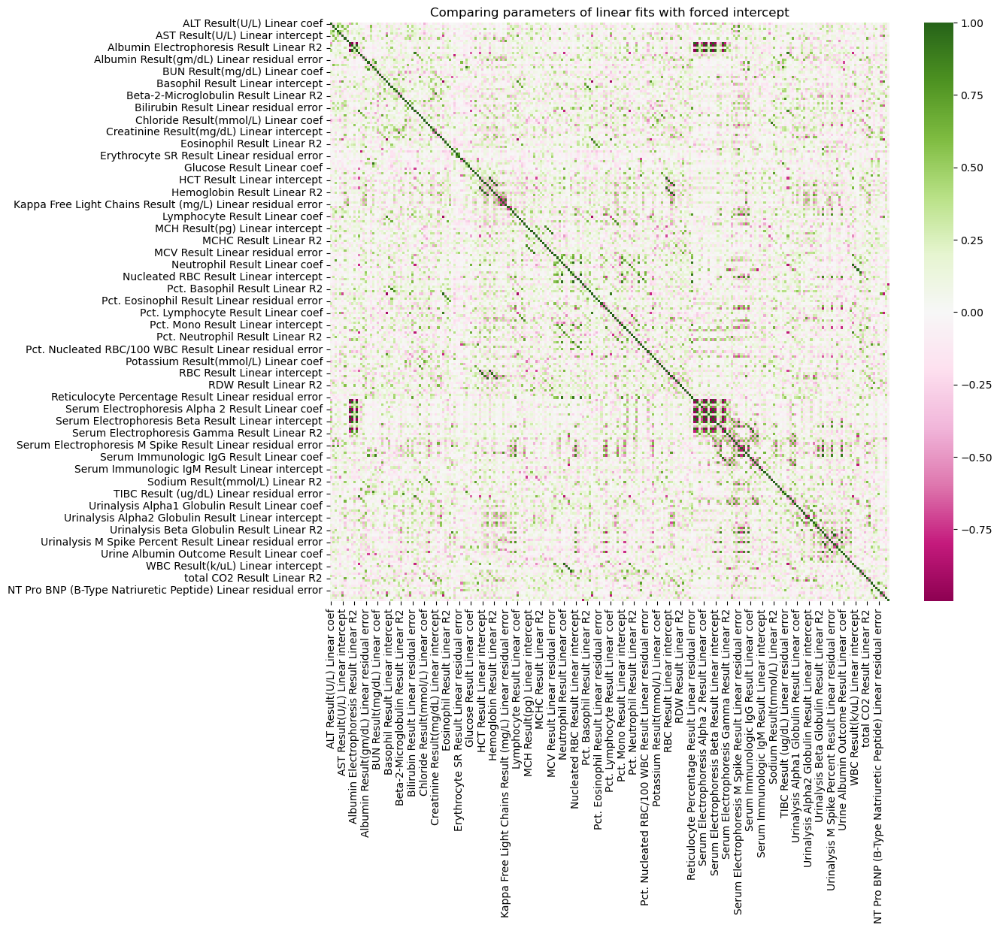

In [63]:
columns_linearfits = []

for column in columns:
    if "Linear" in column: 
        if "NotForced" not in column:
            if "RegresDesc" not in column:
                columns_linearfits.append(column)

#make dataframe of the features describing linear fits
df_linear_features = df[columns_linearfits]

matrix_linear_features = df_linear_features.corr()

fig, ax = plt.subplots(figsize=(12,10))
ax =sns.heatmap(matrix_linear_features, cmap = color_map, annot = False)
plt.title("Comparing parameters of linear fits with forced intercept")

Text(0.5, 1.0, 'Comparing parameters of fit for both linear fits')

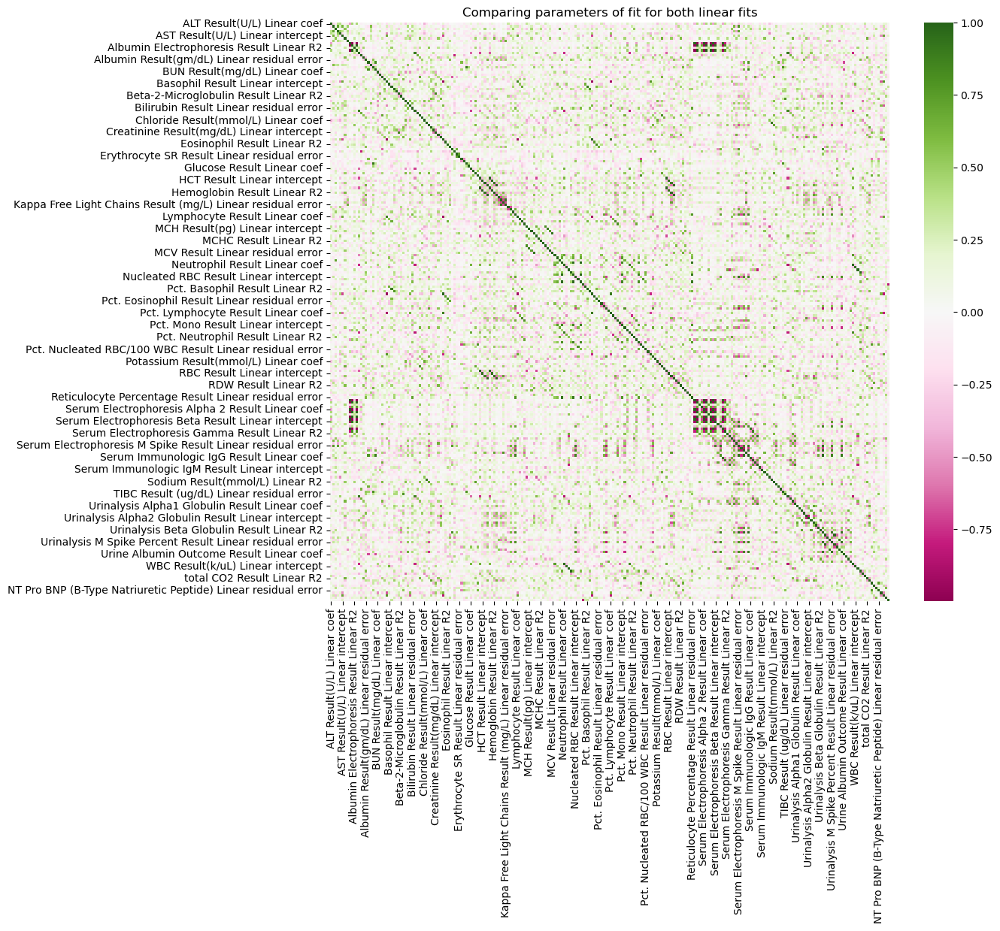

In [64]:
columns_linearfits = []

for column in columns:
    if "Linear" in column: 
        if "RegresDesc" not in column:
            columns_linearfits.append(column)

#make dataframe of the features describing linear fits
df_linear_features = df[columns_linearfits]

matrix_linear_features = df_linear_features.corr()

fig, ax = plt.subplots(figsize=(12,10))
ax = sns.heatmap(matrix_linear_features, cmap = color_map, annot = False)
plt.title("Comparing parameters of fit for both linear fits")

# comparing coefficients of linear vs exponential

Text(0.5, 1.0, 'Comparing parameters of fit between linear and exponential')

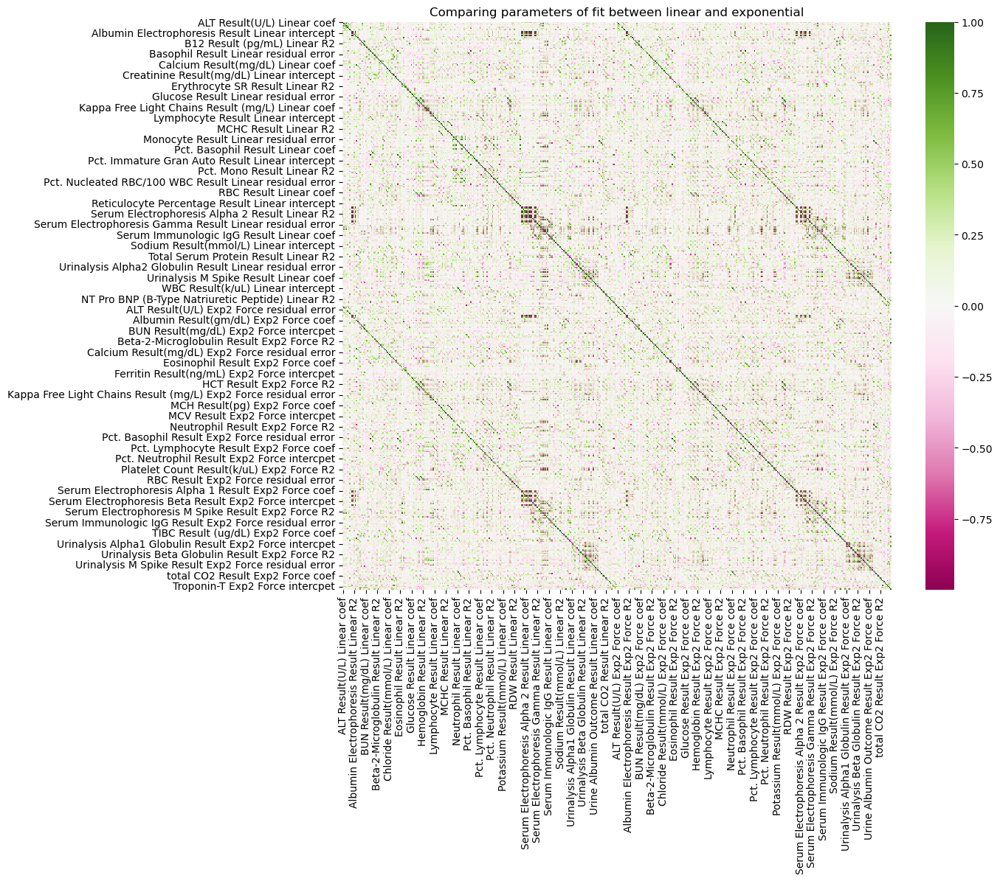

In [66]:
#make dataframe of the features describing linear fits
df_linear_vs_exp_params = pd.concat([df_linear_params, df_exp_params], axis = 1)

matrix_linear_vs_exp_params = df_linear_vs_exp_params.corr()

fig, ax = plt.subplots(figsize=(12,10))
ax = sns.heatmap(matrix_linear_vs_exp_params, cmap = color_map, annot = False)
plt.title("Comparing parameters of fit between linear and exponential")